In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib as mpl

import qnmfits
import analytic_fit
import utils
import corner
import emcee

plt.rcParams.update(utils.rcparams)

In [2]:
rng = np.random.default_rng()

In [3]:
t0_M = pd.read_csv('../data/t0_data_30_to_100.csv', index_col=0)

In [4]:
ID = 4

sim_info = utils.load_cce_data(ID)
sim = sim_info['sim']
chif = sim.chif_mag
Mf = sim.Mf

In [5]:
N = 11
t0 = t0_M[str(ID)].values[N]
T = 100
modes = [(2, 2, n, 1) for n in range(N+1)]
modes_with_320 = [(2, 2, n, 1) for n in range(N+1)] + [(3,2,0,1)]

In [6]:
t0

np.float64(-2.7344823340899893)

In [7]:
best_fit_with_320 = qnmfits.ringdown_fit(
    sim.times,
    sim.h[2,2],
    modes=modes_with_320,
    Mf=Mf,
    chif=chif,
    t0=t0,
    t0_method='closest'
)

In [8]:
A320 = np.abs(best_fit_with_320['C'])[-1]
A320

np.float64(0.0008812997735647111)

In [9]:
ls_fit = qnmfits.ringdown_fit(
    sim.times,
    sim.h[2,2],
    modes=modes,
    Mf=Mf,
    chif=chif,
    t0=t0,
    t0_method='closest'
)

In [10]:
omega = ls_fit['frequencies']

ls_re_c = np.real(ls_fit['C'])
ls_im_c = np.imag(ls_fit['C'])

ls_re_c_im_c = []
for re_c, im_c in zip(ls_re_c, ls_im_c):
    ls_re_c_im_c.append(re_c)
    ls_re_c_im_c.append(im_c)

ls_a = np.abs(ls_fit['C'])
ls_phi = np.angle(ls_fit['C'])
ls_a_phi = np.concatenate((ls_a, ls_phi))

In [11]:
data = {
    'plus': np.real(sim.h[2,2]),
    'cross': -np.imag(sim.h[2,2]),
}

In [12]:
samples, A_samples, phi_samples = analytic_fit.sample(
    times=sim.times,
    data=data,
    sigma=A320*np.ones_like(sim.times),
    qnm_omegas=omega,
    t0=t0,
    t0_method='closest',
    T=T,
    reweight=False,
)

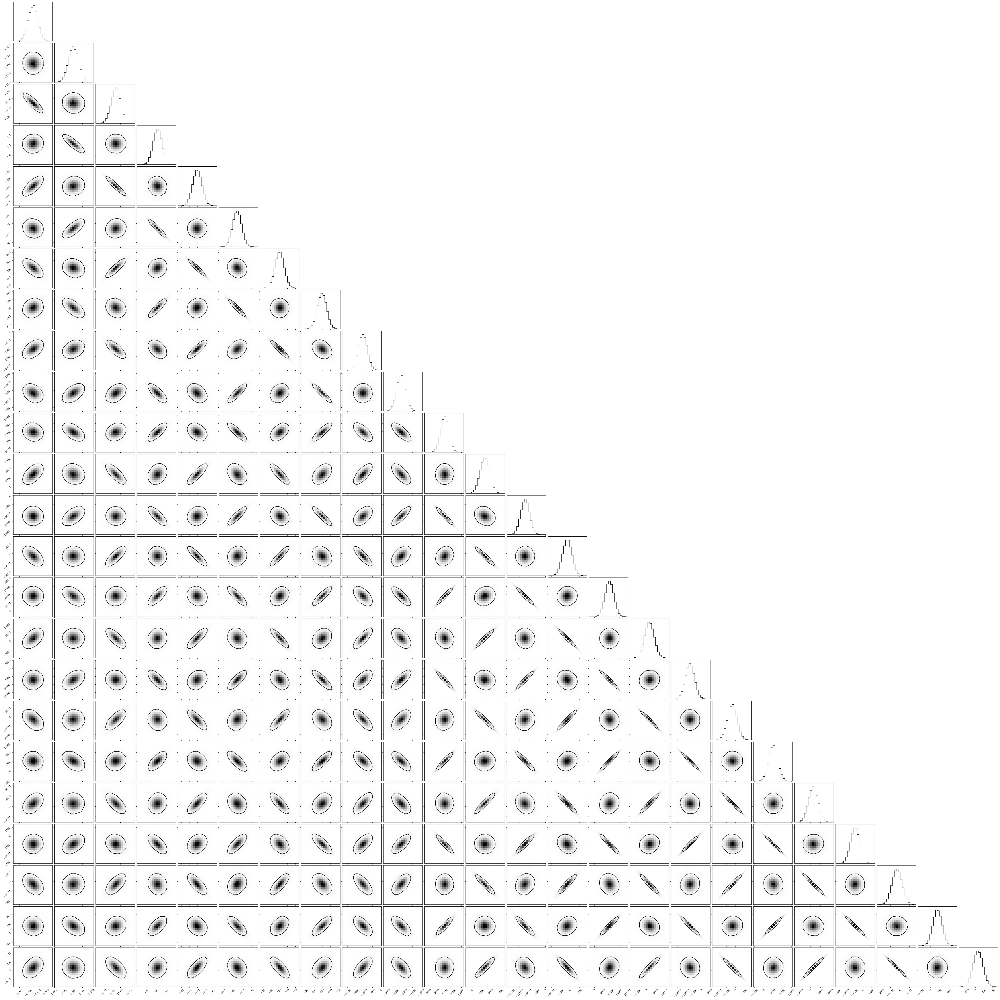

In [13]:
fig = corner.corner(
    samples,
    levels=[0.9],
    data_kwargs={
        'alpha': 0.005,
    }
)

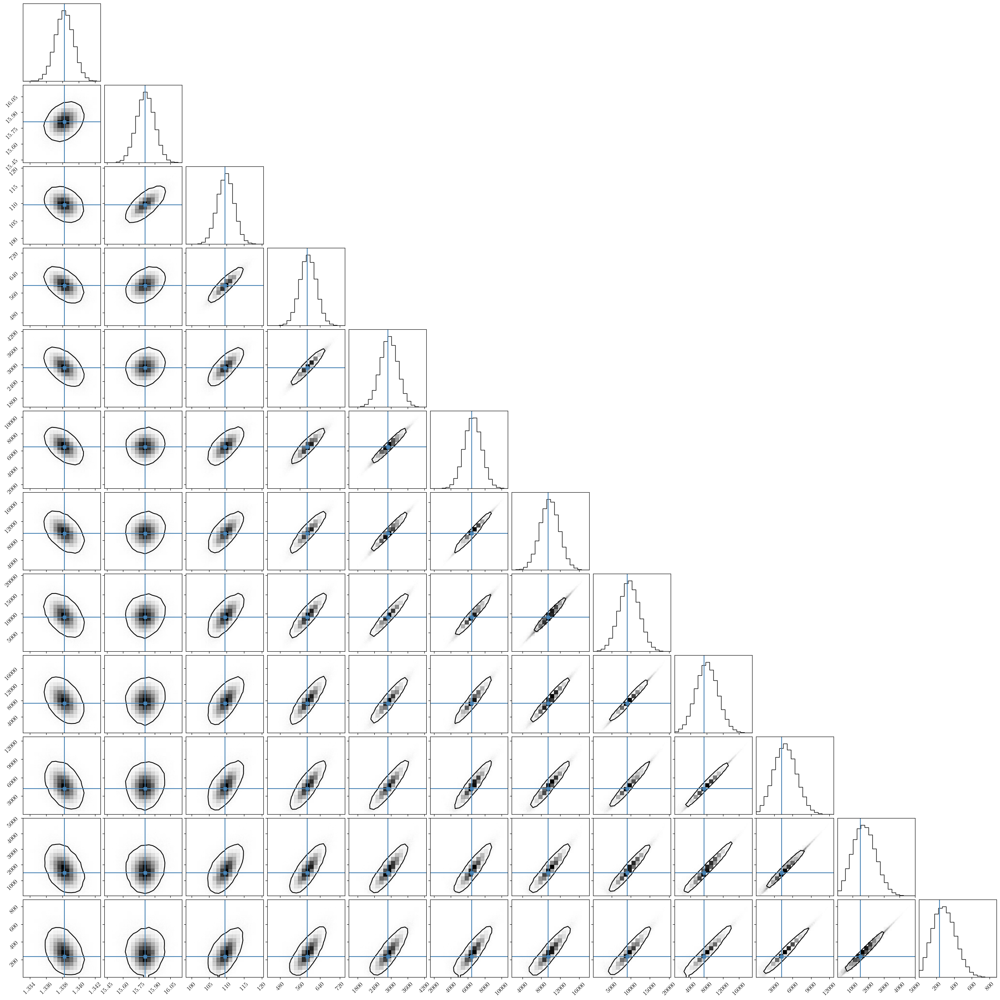

In [14]:
fig = corner.corner(
    A_samples,
    truths=list(np.abs(ls_fit['C'])),
    levels=[0.9],
    data_kwargs={
        'alpha': 0.005,
    }
)

In [15]:
start_index = np.argmin((sim.times-t0)**2)
end_index = np.argmin((sim.times-t0-T)**2)

analysis_times = sim.times[start_index:end_index] - t0

analysis_data = {}
for pol, h in data.items():
    analysis_data[pol] = h[start_index:end_index]

sigma = A320*np.ones_like(analysis_times)

lower = 2*np.min(samples)
upper = 2*np.max(samples)
stds = np.std(samples, axis=0)

In [16]:
def ringdown_model(theta, times, frequencies):
    """
    Ringdown model class.

    Parameters
    ----------
    times : array-like
        The time values at which the model is evaluated.
    theta : dict
        Contains re[C] and im[C] for each requested mode.
    frequencies : array-like
        The frequencies corresponding to each qnm.
    """

    model = np.zeros_like(times, dtype=complex)

    real_amplitudes = theta[::2]
    imag_amplitudes = theta[1::2]

    for re_c, im_c, omega in zip(real_amplitudes, imag_amplitudes, frequencies):
        model += (re_c+1j*im_c)*np.exp(-1j*omega*times)

    model_dict = {'plus': np.real(model), 'cross': -np.imag(model)}
    
    return model_dict

In [17]:
def log_likelihood(theta, data, times, sigma, frequencies):

    h_theta = ringdown_model(theta, times, frequencies)

    log_Lplus = -0.5*sum(((data['plus']-h_theta['plus'])/sigma)**2)
    log_Lcross = -0.5*sum(((data['cross']-h_theta['cross'])/sigma)**2)
    
    return log_Lplus + log_Lcross

def log_prior(theta, lower, upper):
    # Check whether any param is outside of its appropriate range
    if np.all(np.logical_and(lower <= theta, theta <= upper)):
        return 0.0
    return -np.inf

def log_probability(theta, data, times, sigma, frequencies, lower, upper):

    # Calculate log prior. If log prior = 0, then probability is 0.
    logp = log_prior(theta, lower, upper)
    if not np.isfinite(logp):
        return -np.inf
    
    # Return log prior + log likelihood
    return logp + log_likelihood(theta, data, times, sigma, frequencies)

In [18]:
# Pick a set of random starting locations around the least-squares result
pos = ls_re_c_im_c + rng.standard_normal((64, 2*len(modes)))
nwalkers, ndim = pos.shape

In [19]:
# create sampler and run
sampler = emcee.EnsembleSampler(
    nwalkers, 
    ndim, 
    log_probability, 
    args=(
        analysis_data,
        analysis_times,  
        sigma,
        omega,
        lower,
        upper
        ),
)
sampler.run_mcmc(pos, 10000, progress=True);

100%|██████████| 10000/10000 [03:33<00:00, 46.87it/s]


In [20]:
tau = sampler.get_autocorr_time(quiet=True)
print(tau)

N/50 = 200;
tau: [ 15.99718778  18.72726553 257.30293506 296.18502856 268.67859459
 346.20406957 261.95832877 356.89694143 264.90555614 354.79933305
 336.57392092 277.16971548 353.2667429  261.9303015  347.72284195
 264.91295826 340.8717167  268.96392389 335.35736863 271.92958901
 331.18371974 274.10323602 327.98218933 275.77471959]


[ 15.99718778  18.72726553 257.30293506 296.18502856 268.67859459
 346.20406957 261.95832877 356.89694143 264.90555614 354.79933305
 336.57392092 277.16971548 353.2667429  261.9303015  347.72284195
 264.91295826 340.8717167  268.96392389 335.35736863 271.92958901
 331.18371974 274.10323602 327.98218933 275.77471959]


In [21]:
real_labels = [f'$\mathrm{{Re}}[C_{{{ell}{m}{n}}}]$' for (ell,m,n,_) in modes]
imag_labels = [f'$\mathrm{{Im}}[C_{{{ell}{m}{n}}}]$' for (ell,m,n,_) in modes]
labels = []
for real, imag in zip(real_labels, imag_labels):
    labels.append(real)
    labels.append(imag)

In [22]:
emcee_samples = sampler.get_chain(
    discard=int(2*np.mean(tau)), 
    thin=int(np.mean(tau)/2), 
    flat=True
    )

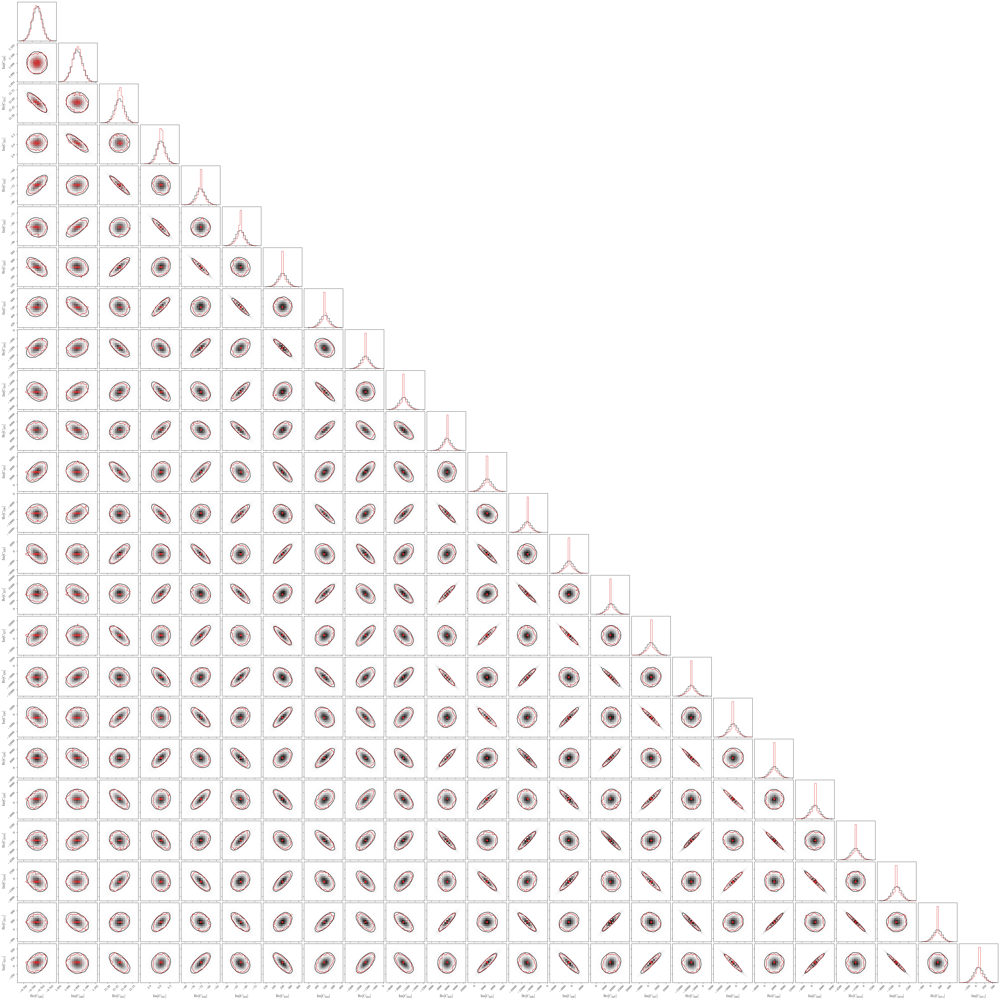

In [23]:
fig = corner.corner(
    samples,
    levels=[0.9],
    labels=labels,
    data_kwargs={
        'alpha': 0.005,
    },
    hist_kwargs={
        'density': True,
    }
)
corner.corner(
    emcee_samples,
    levels=[0.9],
    no_fill_contours=True,
    plot_datapoints=False,
    color='C3',
    hist_kwargs={
        'density': True,
    },
    fig=fig
);